In [50]:
!pip install procgen > /dev/null 2>&1

In [51]:
import torch
from procgen import ProcgenEnv
from agent import Agent
from procgen_wrappers import VecExtractDictObs, TransposeFrame, ScaledFloatFrame
import matplotlib.pyplot as plt
import numpy as np
import cv2



agent = Agent().cuda()
agent.load_state_dict(torch.load('agent_weights.pth'))

env = ProcgenEnv(
        num_envs=1,
        env_name="fruitbot",
        start_level=0,
        num_levels=100,
        distribution_mode='easy',
    )

env = VecExtractDictObs(env, "rgb")
env = TransposeFrame(env)
env = ScaledFloatFrame(env)

(-0.5, 63.5, 63.5, -0.5)

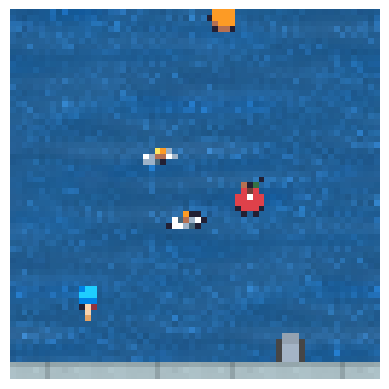

In [52]:
obs = env.reset()
plt.imshow(obs[0].transpose(1,2,0))
plt.axis('off')

In [53]:
import imageio
from IPython.display import Image
from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt
import numpy as np

def obs_to_image(obs):
  return (obs[0].transpose(1,2,0) * 255).astype(np.uint8)
def obs_to_tensor(obs, device='cuda'):
    obs_tensor = torch.FloatTensor(obs).to(device)
    obs_tensor.requires_grad_()
    return obs_tensor

def saliency_to_image(saliency):
    saliency = saliency - saliency.min()
    saliency = saliency / saliency.max()
    saliency = np.uint8(saliency * 255)
    saliency_rgb = np.stack((saliency, saliency, saliency), axis=-1)
    return saliency_rgb

def grad_to_image(grad):
    grad = grad - grad.min()
    grad = grad / grad.max()
    grad = np.uint8(grad * 255)
    grad_rgb = np.stack((grad, grad, grad), axis=-1)
    return grad_rgb

def display_trajectory(frames, is_saliency=False,grad=False, fps=25):
    if is_saliency:
        images = [saliency_to_image(frame) for frame in frames]
    elif grad:
        images=  [grad_to_image(frame) for frame in frames]
    else:
        images = [obs_to_image(frame) for frame in frames]

    imageio.mimwrite('./tmp.gif', images, fps=fps)
    return Image(open('tmp.gif', 'rb').read(), width=500, height=500)

def combine_frames(frame, vanilla_grad, saliency_map, grad_cam_heatmap):
    frame_img = obs_to_image(frame)
    vanilla_grad_img = grad_to_image(vanilla_grad)
    saliency_img = saliency_to_image(saliency_map)
    grad_cam_img = saliency_to_image(grad_cam_heatmap)
    combined_img = np.hstack((frame_img, vanilla_grad_img, saliency_img, grad_cam_img))
    return combined_img


def display_combined_trajectory(frames, vanilla_grad_frames, saliency_maps, grad_cam_heatmaps, fps=25):
    combined_images = []
    for frame, vanilla_grad, saliency, grad_cam in zip(frames, vanilla_grad_frames, saliency_maps, grad_cam_heatmaps):
        combined_img = combine_frames(frame, vanilla_grad, saliency, grad_cam)
        combined_images.append(combined_img)
    imageio.mimwrite('./combined_tmp.gif', combined_images, fps=fps)
    return Image(open('combined_tmp.gif', 'rb').read(), width=2000, height=500)




In [54]:
def vanilla_gradient_back_propagation(obs_tensor, agent):
    obs_tensor.requires_grad_()
    action = agent(obs_tensor).max(1).values
    agent.zero_grad()
    action.backward()
    saliency, _ = torch.max(obs_tensor.grad.data.abs(), dim=1)
    saliency = saliency.squeeze(0)
    return saliency.cpu()

In [55]:

def get_smooth_grad(obs_tensor, model, stdev_spread=0.15, n_samples=25, device='cuda'):
    stdev = stdev_spread * (obs_tensor.max() - obs_tensor.min())
    total_gradients = torch.zeros_like(obs_tensor)
    for i in range(n_samples):
        noise = torch.randn_like(obs_tensor) * stdev
        noisy_img = (obs_tensor + noise).clone().detach().requires_grad_(True)
        action_predictions = model(noisy_img)
        action_predictions_max, _ = action_predictions.max(1)
        model.zero_grad()
        action_predictions_max.backward()
        total_gradients += noisy_img.grad ** 2
    total_gradients /= n_samples
    saliency, _ = torch.max(total_gradients.abs(), dim=1)
    saliency = np.squeeze(saliency.squeeze(0).cpu().numpy() )
    return saliency

In [56]:
class GradCam:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.feature_maps = None
        self.hook_layers()

    def hook_layers(self):
        def hook_function(module, grad_in, grad_out):
            self.gradients = grad_out[0]
        target_layer_module = self.model.features.block3.res2.conv2
        target_layer_module.register_forward_hook(lambda module, input, output: self.save_feature_maps(output))
        target_layer_module.register_backward_hook(hook_function)

    def save_feature_maps(self, output):
        self.feature_maps = output

    def generate_heatmap(self, input_tensor):
        self.model.zero_grad()
        output = self.model(input_tensor)
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0, torch.argmax(output)] = 1
        output.backward(gradient=one_hot_output)

        gradients = self.gradients.detach().cpu().numpy()[0]
        feature_maps = self.feature_maps.detach().cpu().numpy()[0]
        weights = np.mean(gradients, axis=(1, 2))

        grad_cam = np.zeros(feature_maps.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            grad_cam += w * feature_maps[i]

        grad_cam = np.maximum(grad_cam, 0)
        grad_cam = cv2.resize(grad_cam, (input_tensor.shape[2], input_tensor.shape[3]))
        grad_cam = grad_cam - np.min(grad_cam)
        grad_cam = grad_cam / np.max(grad_cam)
        return grad_cam

In [57]:
frames = []
saliency_maps = []
obs = env.reset()
vanilla_grad_frames = []
grad_cam_heatmaps = []
grad_cam = GradCam(agent, target_layer='features.block3.res2.conv2')

while True:
    frames.append(obs)
    obs_tensor = obs_to_tensor(obs)
    vanilla_grad_frames.append(vanilla_gradient_back_propagation(obs_tensor, agent))
    saliency_maps.append(get_smooth_grad(obs_tensor, agent, device='cuda'))
    grad_cam_heatmaps.append(grad_cam.generate_heatmap(obs_tensor))
    obs = torch.FloatTensor(obs).to('cuda')
    action = agent(obs).argmax(1).cpu().numpy()
    obs, _, done, _ = env.step(action)

    if done[0]:
        break

env.close()

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1359: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
<ipython-input-56-e47af461d6c4>:37: RuntimeWarning: invalid value encountered in divide
  grad_cam = grad_cam / np.max(grad_cam)


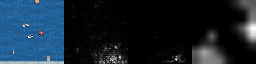

In [58]:
display_combined_trajectory(frames, vanilla_grad_frames, saliency_maps, grad_cam_heatmaps)

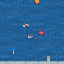

In [59]:
display_trajectory(frames)

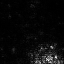

In [60]:
display_trajectory(vanilla_grad_frames, grad=True)

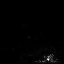

In [61]:
display_trajectory(saliency_maps, is_saliency=True)

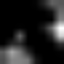

In [62]:
display_trajectory(grad_cam_heatmaps, is_saliency=True)